In [1]:
import requests
import s3fs
from pprint import pprint
import xarray as xr
import numpy
from matplotlib import animation, pyplot as plt
import cartopy.crs as ccrs
import cartopy
from IPython.core.display import display, HTML
import hvplot.xarray

#to make big figures
plt.rcParams['figure.figsize'] = 12, 6

In [2]:
#select SSS L4: 
dataset='podaac-ops-cumulus-protected/OISSS_L4_multimission_7day_v1'
shortname='OISSS_L4_multimission_7day_v1'

#timeframe of interest:
start_date = '2015-08-01T00:00:00Z'
end_date   = '2020-10-31T23:59:59Z'

#region of interest:
lonmin = -170.0
latmin = 65.0
lonmax = -120.0
latmax = 80.0

In [3]:
CMR_OPS = 'https://cmr.earthdata.nasa.gov/search'
url = f'{CMR_OPS}/{"collections"}'

In [4]:
provider = 'POCLOUD'
response = requests.get(url,
                        params={
                            'cloud_hosted': 'True',
                            'has_granules': 'True',
                            'provider': provider,
                            'page_size': 251,
                        },
                        headers={
                            'Accept': 'application/json'
                        }
                       )

In [5]:
response.headers['cmr-hits']

'251'

In [6]:
#to find the concept ID and/or shortname
collections = response.json()['feed']['entry']
# for collection in collections:
#     print(f'{collection["archive_center"]} {collection["dataset_id"]} {collection["id"]}')
#OR
# provider = 'POCLOUD'
# response = requests.get(url,
#                         params={
#                             'short_name': shortname,
#                             'cloud_hosted': 'True',
#                             'has_granules': 'True',
#                             'provider': provider,
#                             'page_size': 251,
#                         },
#                         headers={
#                             'Accept': 'application/json'
#                         }
#                        )
# collections = response.json()['feed']['entry']
# for collection in collections:
#     print(f'{collection["archive_center"]} {collection["dataset_id"]} {collection["id"]}')
#OR
# This prints only OISSS-related collections/datasets if you don't know the short name
for collection in collections:
    ID = f'{collection["archive_center"]} {collection["dataset_id"]} {collection["id"]}'
    if "Salinity" in ID:
        print(ID)


NASA/JPL/PODAAC ECCO Ocean Temperature and Salinity - Monthly Mean 0.5 Degree (Version 4 Release 4) C1990404795-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Three-Dimensional Salinity Fluxes - Daily Mean llc90 Grid (Version 4 Release 4) C1991543814-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Three-Dimensional Salinity Fluxes - Monthly Mean llc90 Grid (Version 4 Release 4) C1991543752-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Temperature and Salinity - Daily Mean 0.5 Degree (Version 4 Release 4) C1990404821-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Temperature and Salinity - Daily Mean llc90 Grid (Version 4 Release 4) C1991543736-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Temperature and Salinity - Monthly Mean llc90 Grid (Version 4 Release 4) C1991543728-POCLOUD
NASA/JPL/PODAAC ECCO Ocean Temperature and Salinity - Snapshot llc90 Grid (Version 4 Release 4) C1991543757-POCLOUD
NASA/JPL/PODAAC Multi-Mission Optimally Interpolated Sea Surface Salinity Global Dataset V1 C2095055342-POCLOUD


In [7]:
concept_id='C2095055342-POCLOUD' #got from the list above
url = f'{CMR_OPS}/{"granules"}'
spacebox=f'{lonmin},{latmin},{lonmax},{latmax}' #SW lon, SW lat, NE lon, NE lat #no impact because it is a global gridded map
tempbox=f'{start_date},{end_date}'
response = requests.get(url, 
                        params={
                            'concept_id': concept_id,
                            'temporal': tempbox,
                            'bounding_box': spacebox,
                            'page_size': 200,
                            },
                        headers={
                            'Accept': 'application/json'
                            }
                       )
print(response.status_code)
print(response.headers['cmr-hits'])

200
482


In [8]:
granules = response.json()['feed']['entry']
# pprint(granules)

In [9]:
urls = []
for granule in granules:
    # print(granule['boxes'], granule['links'][0]['href'])
    urls.append(granule['links'][0]['href'])

In [10]:
#s3fs
s3_cred_endpoint = {
    'podaac':'https://archive.podaac.earthdata.nasa.gov/s3credentials'}

def get_temp_creds():
    temp_creds_url = s3_cred_endpoint['podaac']
    return requests.get(temp_creds_url).json()

temp_creds_req = get_temp_creds()

s3_client = s3fs.S3FileSystem(anon=False,key=temp_creds_req['accessKeyId'], secret=temp_creds_req['secretAccessKey'], token=temp_creds_req['sessionToken'])

In [11]:
#stack all the files together
fileset = [s3_client.open(file) for file in urls] 
ds_stacked = xr.open_mfdataset(fileset, combine='by_coords')
ds_stacked

<xarray.Dataset>
Dimensions:          (longitude: 1440, latitude: 720, time: 200)
Coordinates:
  * longitude        (longitude) float32 -179.9 -179.6 -179.4 ... 179.6 179.9
  * latitude         (latitude) float32 -89.88 -89.62 -89.38 ... 89.62 89.88
  * time             (time) datetime64[ns] 2015-07-30 2015-08-03 ... 2017-10-03
Data variables:
    sss              (latitude, longitude, time) float32 dask.array<chunksize=(720, 1440, 1), meta=np.ndarray>
    sss_uncertainty  (latitude, longitude, time) float32 dask.array<chunksize=(720, 1440, 1), meta=np.ndarray>
Attributes: (12/42)
    Conventions:                   CF-1.8, ACDD-1.3
    standard_name_vocabulary:      CF Standard Name Table v27
    Title:                         Multi-Mission Optimally Interpolated Sea S...
    Short_Name:                    OISSS_L4_multimission_7d_v1
    Version:                       V1.0
    Processing_Level:              Level 4
    ...                            ...
    geospatial_lat_resolution:     [0.25]
    geospatial_lat_units:          degrees_north
    geospatial_lon_min:            [-180.]
    geospatial_lon_max:            [180.]
    geospatial_lon_resolution:     [0.25]
    geospatial_lon_units:          degrees_east

In [12]:
#select a certain region
ds_stacked_sel=ds_stacked.sel(latitude=slice(latmin,latmax), longitude=slice(lonmin,lonmax))
ds_stacked_sel

<xarray.Dataset>
Dimensions:          (longitude: 200, latitude: 60, time: 200)
Coordinates:
  * longitude        (longitude) float32 -169.9 -169.6 -169.4 ... -120.4 -120.1
  * latitude         (latitude) float32 65.12 65.38 65.62 ... 79.38 79.62 79.88
  * time             (time) datetime64[ns] 2015-07-30 2015-08-03 ... 2017-10-03
Data variables:
    sss              (latitude, longitude, time) float32 dask.array<chunksize=(60, 200, 1), meta=np.ndarray>
    sss_uncertainty  (latitude, longitude, time) float32 dask.array<chunksize=(60, 200, 1), meta=np.ndarray>
Attributes: (12/42)
    Conventions:                   CF-1.8, ACDD-1.3
    standard_name_vocabulary:      CF Standard Name Table v27
    Title:                         Multi-Mission Optimally Interpolated Sea S...
    Short_Name:                    OISSS_L4_multimission_7d_v1
    Version:                       V1.0
    Processing_Level:              Level 4
    ...                            ...
    geospatial_lat_resolution:     [0.25]
    geospatial_lat_units:          degrees_north
    geospatial_lon_min:            [-180.]
    geospatial_lon_max:            [180.]
    geospatial_lon_resolution:     [0.25]
    geospatial_lon_units:          degrees_east

In [13]:
sss=ds_stacked_sel.sss
sss

<xarray.DataArray 'sss' (latitude: 60, longitude: 200, time: 200)>
dask.array<getitem, shape=(60, 200, 200), dtype=float32, chunksize=(60, 200, 1), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 -169.9 -169.6 -169.4 ... -120.6 -120.4 -120.1
  * latitude   (latitude) float32 65.12 65.38 65.62 65.88 ... 79.38 79.62 79.88
  * time       (time) datetime64[ns] 2015-07-30 2015-08-03 ... 2017-10-03
Attributes:
    long_name:              sea surface salinity
    standard_name:          sea_surface_salinity
    units:                  1e-3
    valid_min:              [0.]
    valid_max:              [45.]
    add_factor:             [0.]
    coordinates:            time longitude latudude
    coverage_content_type:  physicalMeasurement

In [14]:
sss.hvplot()

:NdOverlay   [Element]
   :Histogram   [sss]   (sss_count)

In [15]:
sss.std(dim='time').hvplot.image(x='longitude', y='latitude', rasterize=True, width=800, height=600, colorbar=True, cmap='turbo').opts(clim=(0,3))

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


:DynamicMap   []
   :Image   [longitude,latitude]   (sss)

In [21]:
sss.std(dim='time').hvplot.image(x='longitude', y='latitude', width=800, height=600, colorbar=True, cmap='turbo', coastline='10m')
# plt.xlim(  -170., -120.)
# plt.ylim(65.,  80.)

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


:Overlay
   .Image.I     :Image   [longitude,latitude]   (sss)
   .Coastline.I :Feature   [Longitude,Latitude]

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


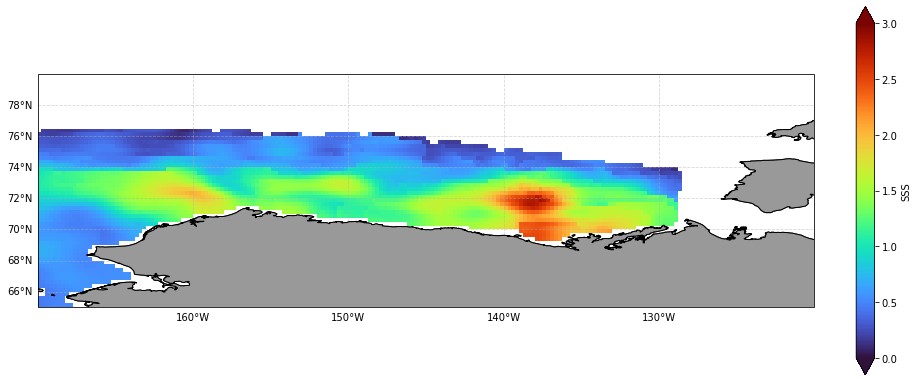

In [25]:
[LO,LA]=numpy.meshgrid(ds_stacked_sel.longitude,ds_stacked_sel.latitude)
fig = plt.figure(figsize=(15,12))
ax = plt.axes(projection = ccrs.PlateCarree(central_longitude=-150))  # Orthographic
extent = [lonmin, lonmax, latmin, latmax]
ax.set_extent(extent, crs=ccrs.PlateCarree())
plt.set_cmap(cmap=plt.get_cmap('turbo'))
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=3, facecolor=[.6,.6,.6], edgecolor='black')
cs = ax.pcolormesh(LO,LA,sss.std(dim='time'),vmin=0,vmax=3,transform=ccrs.PlateCarree(),shading='auto')
cb = plt.colorbar(cs,fraction = 0.022,extend='both')
cb.set_label('SSS',fontsize = 10)